## Setup

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%config InlineBackend.figure_format='retina'

from IPython.display import clear_output

import imageio

import torch

In [16]:
%load_ext autoreload
%autoreload 2

from pde.models.imvp_lightning import IAM4VP
from openstl import load_data

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
import lightning as L
from lightning.pytorch.callbacks import RichProgressBar
from lightning.pytorch.callbacks import ModelCheckpoint
from lightning.pytorch.loggers import WandbLogger

## Dataset

In [17]:
# data_root = '/home/fratnikov/weather_bench/'
data_root = "/home/fa.buzaev/data_5/"
prediction_horizone = 12

In [99]:
dataloader_train, dataloader_vali, dataloader_test = load_data(batch_size=100,
                                                                        val_batch_size=100,
                                                                        data_root=data_root,
                                                                        num_workers=6,
                                                                        data_split='5_625',
                                                                        data_name=['v10', 'u10'],
                                                                        train_time=['2010', '2015'],
                                                                        val_time=['2016', '2016'],
                                                                        test_time=['2017', '2018'],
                                                                        idx_in=[-11, -10, -9, -8, -7, -6, -5, -4, -3, -2, -1, 0],
                                                                        idx_out=[*range(1, prediction_horizone+1)],
                                                                        step=1,
                                                                        levels='all',
                                                                        distributed=False, use_augment=False,
                                                                        use_prefetcher=False, drop_last=False)
mean, std = dataloader_train.dataset.mean, dataloader_train.dataset.std

100%|██████████| 12/12 [00:27<00:00,  2.31s/it]


# Train

In [6]:
model = IAM4VP(shape_in=[12, 2, 32, 64], dataset_std=std, dataset_mean=mean, time_prediction=prediction_horizone)

In [7]:
checkpoint_callback = ModelCheckpoint(
    save_top_k=10,
    monitor="valid/loss",
    mode="min",
    dirpath="/home/knninevskiy/checkpoints",
    filename="weatherbench-{epoch:02d}-{valid/loss:.2f}",
    every_n_epochs=1
)

In [8]:
wandb_logger = WandbLogger(project="WeatherPrediction", name="multigpu_training")

In [ ]:
trainer = L.Trainer(max_epochs=50, accelerator='cuda', callbacks=[checkpoint_callback, RichProgressBar()], logger=wandb_logger, enable_progress_bar=True, devices=2, strategy="ddp_fork")
trainer.fit(model, dataloader_train, dataloader_vali)

# Test

In [38]:
model

IAM4VP(
  (time_mlp): Time_MLP(
    (sinusoidaposemb): SinusoidalPosEmb()
    (learnable_emb): LearnablePosEmb()
    (linear1): Linear(in_features=64, out_features=256, bias=True)
    (gelu): GELU(approximate='none')
    (linear2): Linear(in_features=256, out_features=64, bias=True)
  )
  (tpe): TemporalPositionalEncoding()
  (enc): Encoder(
    (enc): Sequential(
      (0): ConvSC(
        (conv): BasicConv2d(
          (conv): Conv2d(4, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (norm): LayerNorm()
          (act): SiLU(inplace=True)
        )
      )
      (1): ConvSC(
        (conv): BasicConv2d(
          (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (norm): LayerNorm()
          (act): SiLU(inplace=True)
        )
      )
      (2): ConvSC(
        (conv): BasicConv2d(
          (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (norm): LayerNorm()
          (act): SiLU(inplace=True)
    

In [12]:
model.load_state_dict(torch.load("/home/fa.buzaev/prediction_with_pde/notebooks/best_models_weights/imvp_2010_data_10_hours_coeff_0_MAE_50.pth", map_location="cuda"))
# model.load_state_dict(torch.load("best_models_weights/weather_uv10_simvp_uniformer_cos_ep50.pth", map_location="cuda"))
model.eval()

IAM4VP(
  (time_mlp): Time_MLP(
    (sinusoidaposemb): SinusoidalPosEmb()
    (linear1): Linear(in_features=64, out_features=256, bias=True)
    (gelu): GELU(approximate='none')
    (linear2): Linear(in_features=256, out_features=64, bias=True)
  )
  (enc): Encoder(
    (enc): Sequential(
      (0): ConvSC(
        (conv): BasicConv2d(
          (conv): Conv2d(2, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (norm): LayerNorm()
          (act): SiLU(inplace=True)
        )
      )
      (1): ConvSC(
        (conv): BasicConv2d(
          (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (norm): LayerNorm()
          (act): SiLU(inplace=True)
        )
      )
      (2): ConvSC(
        (conv): BasicConv2d(
          (conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (norm): LayerNorm()
          (act): SiLU(inplace=True)
        )
      )
      (3): ConvSC(
        (conv): BasicConv2d(
          (conv

In [13]:
weights = []
for param in model.parameters():
    weights.append(param.data.view(-1))

# Преобразование весов в одномерный тензор
weights = torch.cat(weights)

# Вывод дисперсии весов
print(f"Дисперсия весов: {torch.var(weights)}")

Дисперсия весов: 0.01955191045999527


Text(0.5, 1.0, 'Гистограмма imvp')

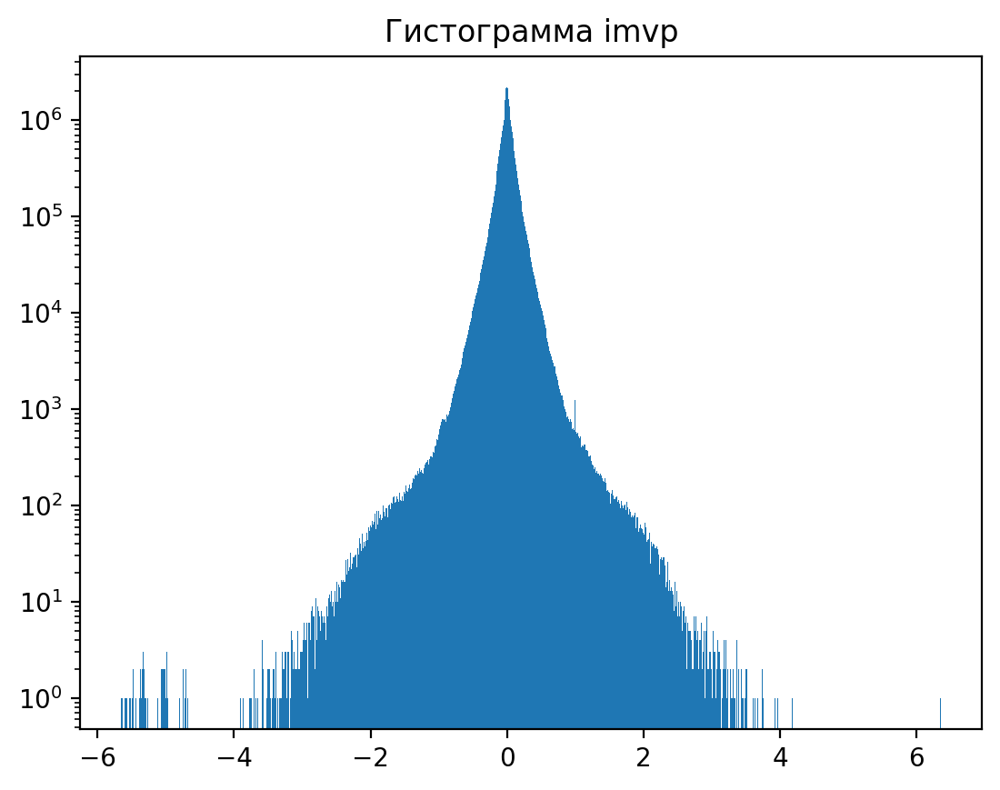

In [14]:
plt.hist(weights.cpu().numpy(),  bins=1000)
plt.yscale("log")
plt.title("Гистограмма imvp")
# plt.savefig("hist_uni_base.png")

In [15]:
import modulus

In [16]:
def denorm(item, std, mean, idx=0):
    mean = mean.squeeze()[idx]
    std = std.squeeze()[idx]
    item_denorm = item * std + mean
    return item_denorm

In [17]:
model = model.to(device)

In [34]:
for x_test, y_test in dataloader_test:
    x_test, y_test = x_test.to(device), y_test.to(device)
    break

In [25]:
x_test_ = torch.empty(x_test.shape, device=device)

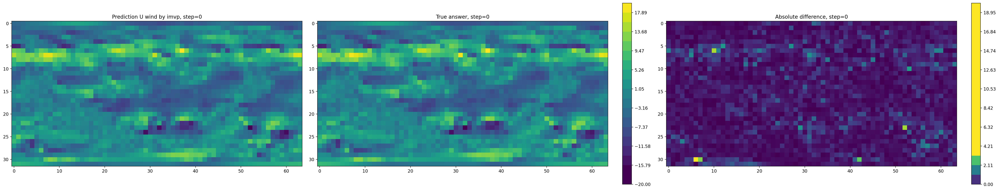

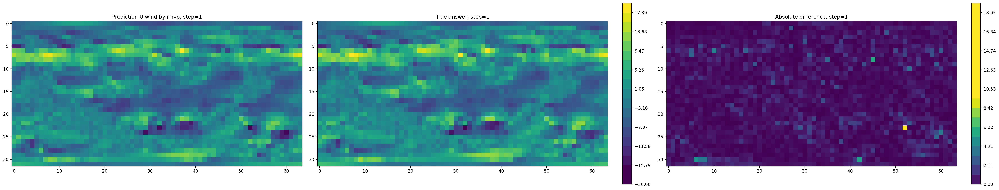

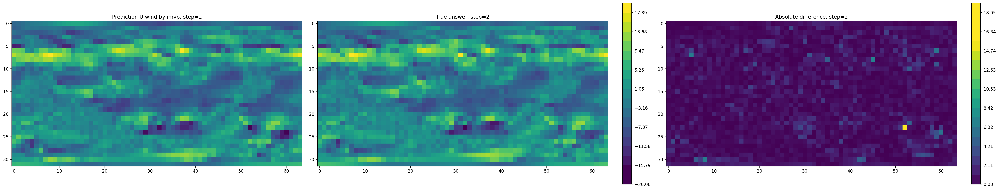

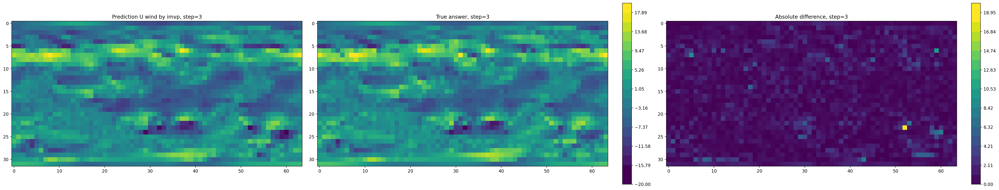

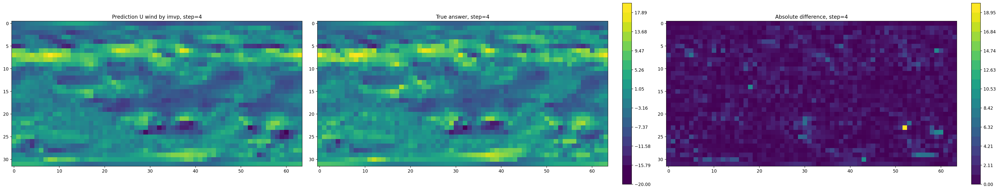

...

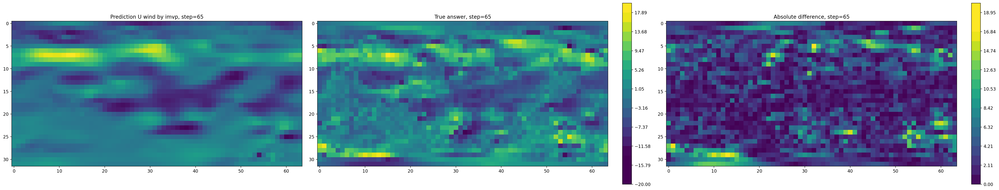

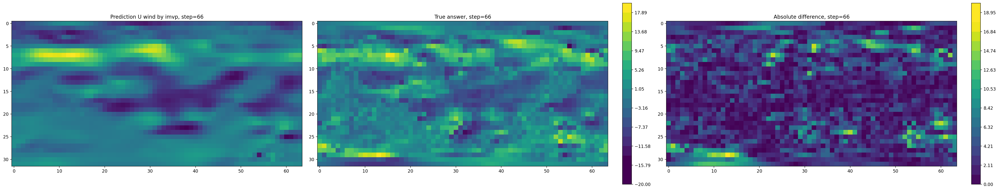

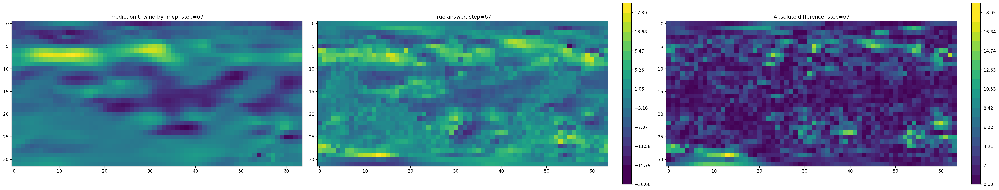

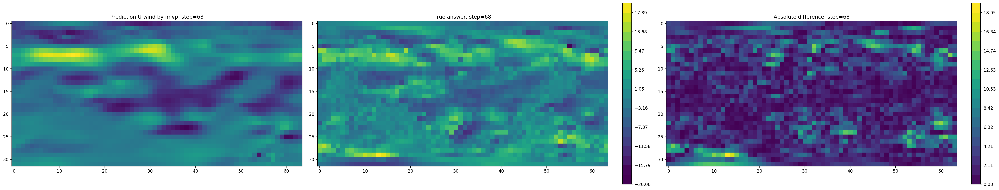

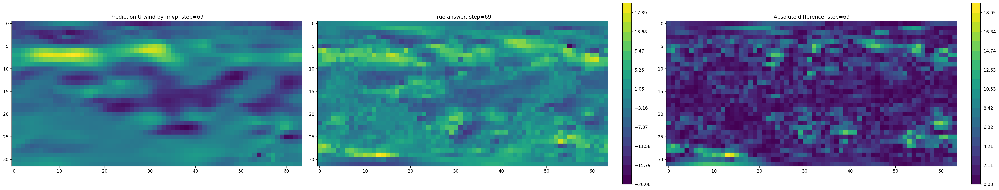

In [31]:
t = 0
x_data = x_test

for i in range(7):
    pred_list = []
    x_test_ = torch.empty(x_test.shape, device=device)
    for j in range(10):

        time_tensor = torch.tensor(j * 100).repeat(x_test.shape[0]).to(device)
        with torch.no_grad():
            prediction = model(x_data, pred_list, time_tensor)

        x_test_[:, j] = prediction
        pred_list.append(prediction.detach())

        plt.figure(constrained_layout=True, figsize=(32, 6))

        plt.subplot(131)
        plt.imshow(denorm(prediction[65, 0], std, mean).squeeze().detach().cpu().numpy())
        plt.title(f"Prediction U wind by imvp, step={t}")
        # plt.colorbar()

        plt.subplot(132)
        plt.imshow(denorm(y_test[65, t, 0], std, mean).squeeze().detach().cpu().numpy())
        plt.title(f"True answer, step={t}")
        plt.colorbar(boundaries=np.linspace(-20, 20, 20))

        plt.subplot(133)
        plt.imshow(np.abs(denorm(prediction[65, 0], std, mean).squeeze().detach().cpu().numpy() - denorm(y_test[65, t, 0], std, mean).squeeze().detach().cpu().numpy()))
        plt.title(f"Absolute difference, step={t}")
        plt.colorbar(boundaries=np.linspace(0, 20, 20))
        clear_output(wait=True)

        plt.savefig(f"predictions/imvp_{t}.png")

        t += 1
    x_data = x_test_

In [33]:
png_dir = 'predictions/png'
images = []
for i in range(70):
    images.append(imageio.imread(f"predictions/imvp_{i}.png"))


imageio.mimsave('predictions/imvp.gif', images)

In [50]:
hours_to_plot = [int(element) for element in np.linspace(0, x_test.shape[0], 7)]

array_to_plot = np.empty((len(hours_to_plot), 70))

In [51]:
array_to_plot.shape

(7, 70)

In [61]:
t = 0

x_data = x_test

hours_to_plot = [int(element) for element in np.linspace(0, x_test.shape[0], x_test.shape[0])]

array_to_plot = np.empty((len(hours_to_plot), 72))

for i in range(7):

    pred_list = []
    x_test_ = torch.empty(x_test.shape, device=device)

    for j in range(10):

        time_tensor = torch.tensor(j * 100).repeat(x_test.shape[0]).to(device)
        with torch.no_grad():
            prediction = model(x_data, pred_list, time_tensor)
        x_test_[:, j] = prediction
        pred_list.append(prediction.detach())

        for id_number, start_i in enumerate(hours_to_plot):
            u_wind_prediction = denorm(prediction[id_number, 0], std, mean)
            metric_u_wind = weighted_rmse_torch(u_wind_prediction.unsqueeze(0).unsqueeze(0), denorm(y_test[id_number, j, 0], std, mean).unsqueeze(0).unsqueeze(0))
            # metric_u_wind = torch.sqrt(torch.nn.functional.mse_loss(u_wind_prediction.unsqueeze(0).unsqueeze(0), denorm(y_test[id_number, j, 0], std, mean).unsqueeze(0).unsqueeze(0)))

            v_wind_prediction = denorm(prediction[id_number, 1], std, mean, idx=1)
            metric_v_wind = weighted_rmse_torch(v_wind_prediction.unsqueeze(0).unsqueeze(0), denorm(y_test[id_number, j, 1], std, mean, idx=1).unsqueeze(0).unsqueeze(0))
            # metric_v_wind = torch.sqrt(torch.nn.functional.mse_loss(v_wind_prediction.unsqueeze(0).unsqueeze(0), denorm(y_test[id_number, j, 1], std, mean, idx=1).unsqueeze(0).unsqueeze(0)))

            metric = (metric_u_wind + metric_v_wind)/2

            array_to_plot[id_number, t] = metric.detach().cpu().item()

        t += 1
    x_data = x_test_

In [62]:
df = pd.DataFrame(array_to_plot)

In [63]:
df.to_csv("imvp.csv")
# df.to_csv("uniformer_72_2010_rmse.csv")

In [64]:
# df_2 = pd.read_csv("uniformer_72_2010_rmse.csv")
df_2 = pd.read_csv("uniformer_base_wrmse.csv")
df_3 = pd.read_csv("uniformer_sfno_wrmse.csv")
df_1 = pd.read_csv("uniformer_fno_wrmse.csv")

df_4 = pd.read_csv("uniformer_v2_sfno_wrmse.csv")
df_5 = pd.read_csv("uniformer_v2_fno_wrmse.csv")

In [65]:
del df_1["Unnamed: 0"]
del df_2["Unnamed: 0"]
del df_3["Unnamed: 0"]
del df_4["Unnamed: 0"]
del df_5["Unnamed: 0"]

In [66]:
df.shape

(400, 72)

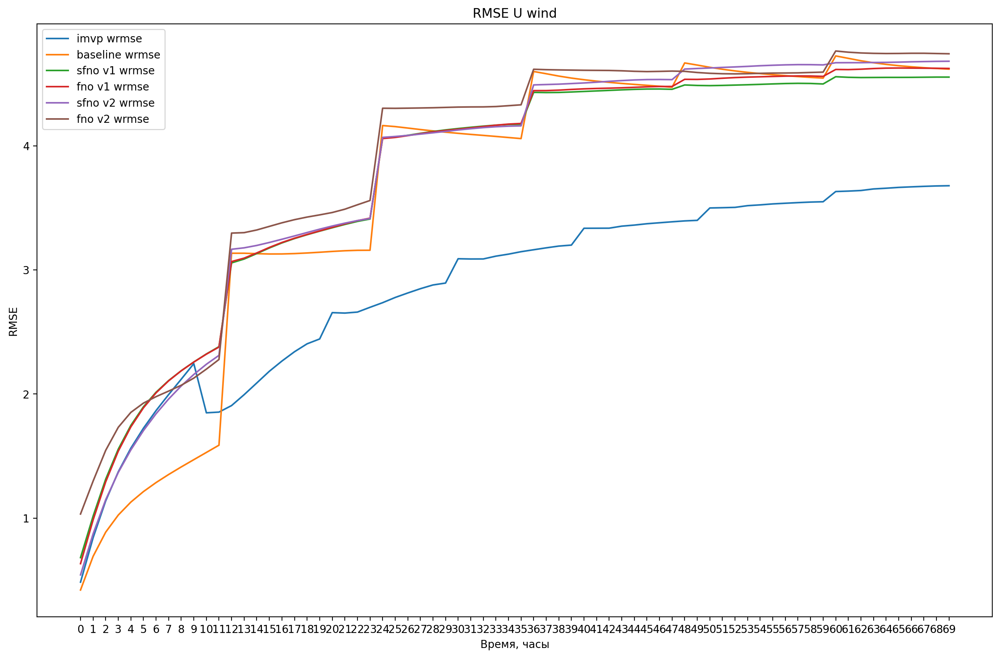

In [67]:
plt.figure(figsize=(16, 10))
plt.title("RMSE U wind")
plt.plot(np.mean(df, axis=0)[:70], label="imvp wrmse")
plt.plot(np.mean(df_2, axis=0)[:70], label="baseline wrmse")
plt.plot(np.mean(df_3, axis=0)[:70], label="sfno v1 wrmse")
plt.plot(np.mean(df_1, axis=0)[:70], label="fno v1 wrmse")
plt.plot(np.mean(df_4, axis=0)[:70], label="sfno v2 wrmse")
plt.plot(np.mean(df_5, axis=0)[:70], label="fno v2 wrmse")
plt.xlabel("Время, часы")
plt.ylabel("RMSE")
plt.legend()

Text(0, 0.5, 'RMSE')

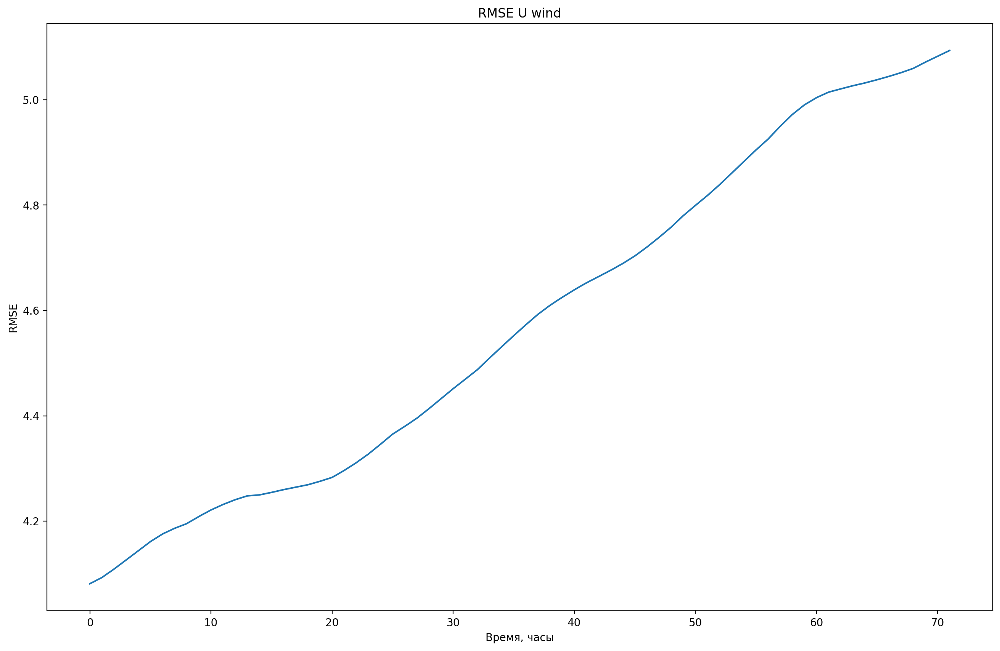

In [85]:
plt.figure(figsize=(16, 10))
plt.title("RMSE U wind")
plt.plot(np.mean(array_to_plot, axis=0))
plt.xlabel("Время, часы")
plt.ylabel("RMSE")

In [89]:
df_old_clear = pd.read_csv("fuxi_without_pde.csv")
df_old_pde = pd.read_csv("fuxi_with_pde.csv")

df_new_clear = pd.read_csv("FUXI_V2_clear_result.csv")
df_new_pde = pd.read_csv("FUXI_V2_train_random_time_PDE_v2_2000_data_72_hours_coeff_1_MAE_75.csv")

df_delta_3600 = pd.read_csv("BIG_FUXI_V3_train_random_time_calculate_pde_3600_loss_v2_L.csv")
df_delta_3600_v2 = pd.read_csv("FUXI_V3_train_random_time_calculate_pde_3600_loss_v2_2000_data.csv")


del df_old_pde["Unnamed: 0"]
del df_old_clear["Unnamed: 0"]
del df_new_clear["Unnamed: 0"]
del df_new_pde["Unnamed: 0"]

del df_delta_3600["Unnamed: 0"]
del df_delta_3600_v2["Unnamed: 0"]

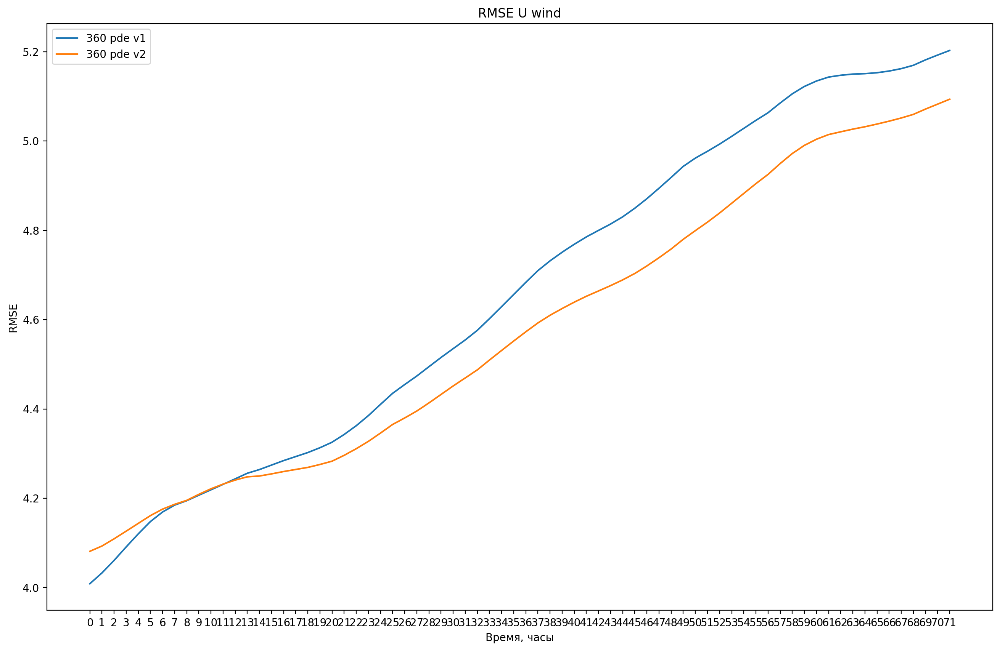

In [90]:
plt.figure(figsize=(16, 10))
plt.title("RMSE U wind")
# plt.plot(np.sqrt(np.mean(df_old_clear, axis=0)), label="old without pde")
# plt.plot(np.sqrt(np.mean(df_old_pde, axis=0)), label="old with pde")
# plt.plot(np.mean(df_new_clear, axis=0), label="without pde")
# plt.plot(np.mean(df_new_pde, axis=0), label="with pde v1")
plt.plot(np.mean(df_delta_3600, axis=0), label="360 pde v1")
plt.plot(np.mean(df_delta_3600_v2, axis=0), label="360 pde v2")
plt.xlabel("Время, часы")
plt.ylabel("RMSE")
plt.legend()

In [ ]:
df_losses_pde = pd.read_csv("logs/BIG_FUXI_V3_train_random_time_calculate_pde_3600_loss_v2_L!_2000_data_72_hours_coeff_1_MAE_v2.csv")
df_losses_clear = pd.read_csv("logs/BIG_FUXI_V2_train_random_time_calculate_pde_and_0.000002continuity_loss_sonya_2000_data_72_hours_coeff_1e6_MAE.csv")

In [ ]:
# df_losses_continuity

Text(0.5, 1.0, 'L1 loss valid')

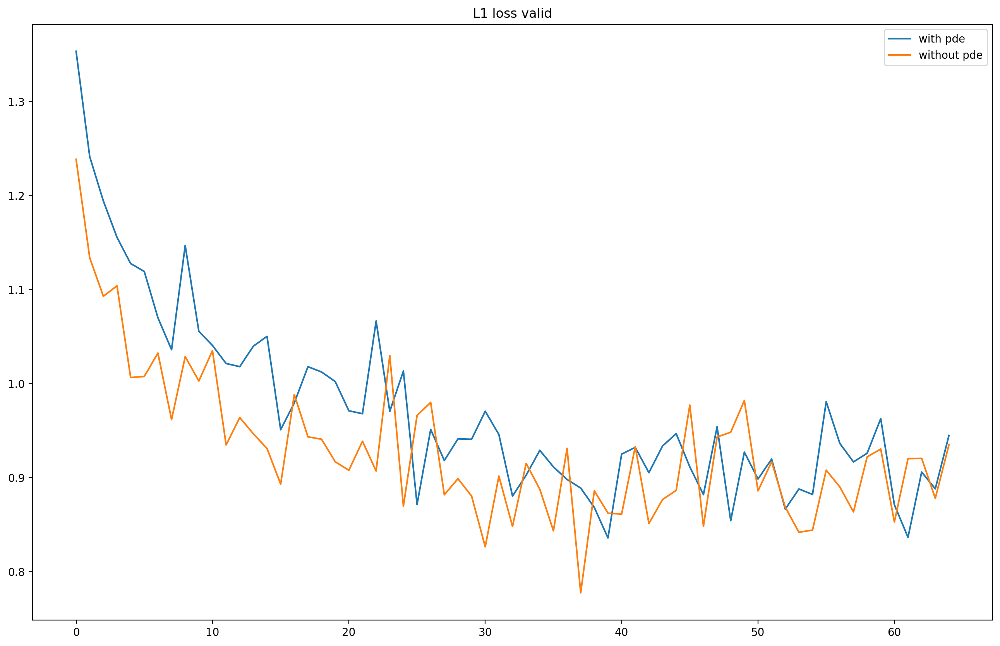

In [103]:
plt.figure(figsize=(16, 10))
plt.plot(df_losses_pde.test_pred[:65], label="with pde")
plt.plot(df_losses_clear.test_pred[:65], label="without pde")
plt.legend()
plt.title("L1 loss valid")

Text(0.5, 1.0, 'L1 loss train and valid')

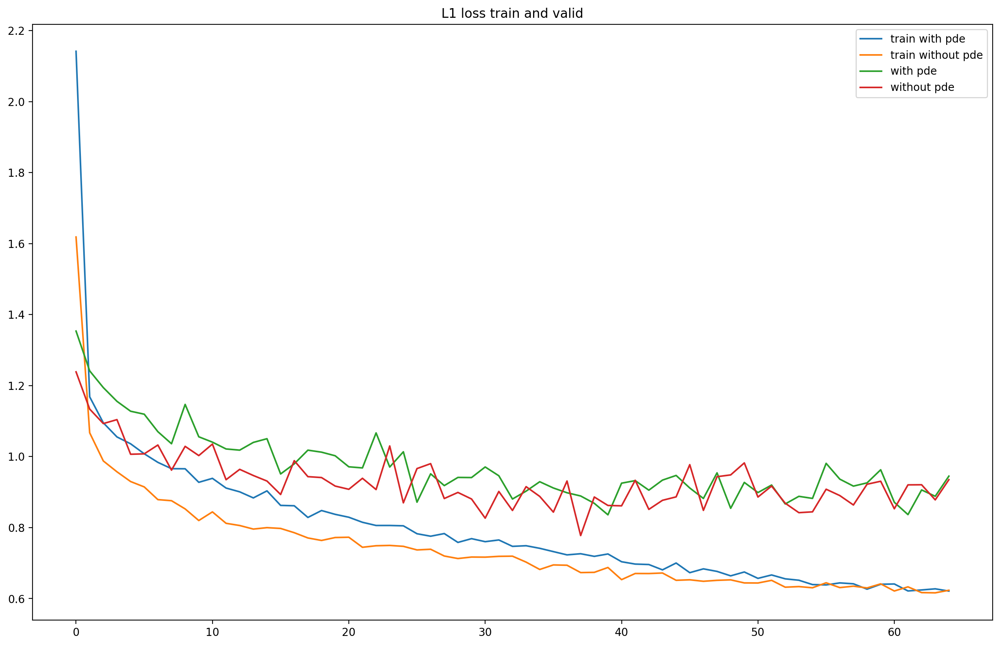

In [105]:
plt.figure(figsize=(16, 10))
plt.plot(df_losses_pde.train_pred[:65], label="train with pde")
plt.plot(df_losses_clear.train_pred[:65], label="train without pde")
plt.plot(df_losses_pde.test_pred[:65], label="with pde")
plt.plot(df_losses_clear.test_pred[:65], label="without pde")
plt.legend()
plt.title("L1 loss train and valid")